<a href="https://colab.research.google.com/github/l1nshengtop/GAN-/blob/main/DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DCGAN代码:

In [8]:
# @title 1. 导入必要库
# -*- coding: utf-8 -*-
"""
DCGAN on FashionMNIST
"""

import torch  # 导入主要的PyTorch库
import torch.nn as nn  # 导入神经网络模块，包含各种网络层和激活函数
import torch.optim as optim  # 导入优化器模块，例如Adam
import torchvision  # 导入专门用于计算机视觉的torchvision库
import torchvision.datasets as datasets  # 导入标准数据集加载模块
import torchvision.transforms as transforms  # 导入图像预处理和数据增强模块
from torch.utils.data import DataLoader  # 导入数据加载器，用于创建数据批次
from torch.utils.tensorboard import SummaryWriter  # 导入TensorBoard的写入器，用于可视化训练过程
import matplotlib.pyplot as plt  # 导入matplotlib库，用于显示图像
import numpy as np  # 导入numpy库，用于科学计算（在此代码中不常用，但属于良好实践）

In [9]:
%load_ext tensorboard

In [10]:
# @title 2. 设置超参数和数据预处理

# -- 超参数定义 --
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # 判断是否有可用的GPU，有则使用cuda，否则使用cpu
lr = 2e-4  # 定义学习率 (Learning Rate)，通常GAN对学习率比较敏感
batch_size = 128  # 定义每个批次处理的图像数量
image_size = 64  # 定义网络处理的图像尺寸，会将原始图像缩放至64x64
channels_img = 1  # 定义输入图像的颜色通道数 (FashionMNIST是灰度图，所以是1)
z_dim = 100  # 定义输入给生成器的随机噪声向量的维度
num_epochs = 2  # 定义总的训练轮数

# -- 数据预处理和加载 --
transform = transforms.Compose(  # 创建一个图像预处理的流水线
    [
        transforms.Resize(image_size),  # 第一步：将图像尺寸调整为 image_size (64x64)
        transforms.ToTensor(),  # 第二步：将PIL图像或Numpy数组转换为PyTorch张量，并将像素值从[0, 255]缩放到[0, 1]
        transforms.Normalize(  # 第三步：将张量进行归一化
            [0.5 for _ in range(channels_img)],  # 均值 (对于单通道就是[0.5])
            [0.5 for _ in range(channels_img)],  # 标准差 (对于单通道就是[0.5])
        ), # 经过此步，像素值范围从[0, 1]变为[-1, 1]，以匹配生成器Tanh输出
    ]
)

# 加载FashionMNIST数据集 (也可以换成MNIST)
train_dataset = datasets.FashionMNIST(root="dataset/", train=True, transform=transform, download=True) # 加载训练集，应用transform，若本地没有则自动下载
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) # 创建数据加载器，自动打包数据、打乱顺序、并行加载

In [11]:
# @title 3. 搭建模型 (基于CNN生成器和判别器)

# -- 定义判别器 (Discriminator) --
class Discriminator(nn.Module):  # 定义判别器类，继承自 nn.Module
    def __init__(self, channels_img, features_d): # 构造函数，传入图像通道数和初始特征图数量
        super(Discriminator, self).__init__()  # 调用父类的构造函数
        self.disc = nn.Sequential(  # 使用 nn.Sequential 构建一个序列化的网络模型
            # 输入层: 输入的形状是 N x channels_img x 64 x 64
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1), # 第一个卷积层，步长为2，图像尺寸减半(32x32)
            nn.LeakyReLU(0.2), # 使用LeakyReLU作为激活函数，防止梯度消失
            # 后续卷积块，逐步提取特征并减小图像尺寸
            self._block(features_d, features_d * 2, 4, 2, 1), # 第二个卷积块，输出16x16
            self._block(features_d * 2, features_d * 4, 4, 2, 1), # 第三个卷积块，输出8x8
            self._block(features_d * 4, features_d * 8, 4, 2, 1), # 第四个卷积块，输出4x4
            # 输出层: 将特征图最终压缩成一个单一的数值
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0), # 最终卷积层，输出1x1的特征图
            nn.Sigmoid(), # 使用Sigmoid激活函数将输出值压缩到[0, 1]之间，代表“是真实图片的概率”
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding): # 定义一个判别器的标准卷积块的辅助函数
        return nn.Sequential( # 返回一个包含卷积、批归一化和激活函数的序列
            nn.Conv2d(
                in_channels, # 输入通道数
                out_channels, # 输出通道数
                kernel_size, # 卷积核大小
                stride, # 步长
                padding, # 填充
                bias=False, # 因为使用了BatchNorm，所以通常不使用偏置项
            ),
            nn.BatchNorm2d(out_channels), # 批归一化层，稳定训练
            nn.LeakyReLU(0.2), # LeakyReLU激活函数
        )

    def forward(self, x): # 定义模型的前向传播过程
        return self.disc(x) # 将输入x传递给序列模型self.disc并返回结果

# -- 定义生成器 (Generator) --
class Generator(nn.Module): # 定义生成器类，继承自 nn.Module
    def __init__(self, z_dim, channels_img, features_g): # 构造函数，传入噪声维度、目标图像通道数和初始特征图数量
        super(Generator, self).__init__() # 调用父类的构造函数
        self.net = nn.Sequential( # 使用 nn.Sequential 构建一个序列化的网络模型
            # 输入层: 输入的是一个 N x z_dim x 1 x 1 的噪声向量
            self._block(z_dim, features_g * 16, 4, 1, 0),  # 第一个反卷积块，从1x1上采样到4x4
            self._block(features_g * 16, features_g * 8, 4, 2, 1),  # 第二个块，上采样到8x8
            self._block(features_g * 8, features_g * 4, 4, 2, 1),  # 第三个块，上采样到16x16
            self._block(features_g * 4, features_g * 2, 4, 2, 1),  # 第四个块，上采样到32x32
            # 输出层: 最终生成目标尺寸的图像
            nn.ConvTranspose2d( # 最后一个反卷积层
                features_g * 2, channels_img, kernel_size=4, stride=2, padding=1 # 上采样到64x64
            ),
            # 输出形状: N x channels_img x 64 x 64
            nn.Tanh(), # 使用Tanh激活函数，将输出像素值压缩到[-1, 1]之间
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding): # 定义一个生成器的标准反卷积块的辅助函数
        return nn.Sequential( # 返回一个包含反卷积、批归一化和激活函数的序列
            nn.ConvTranspose2d( # 反卷积（或称转置卷积）层，用于上采样
                in_channels, # 输入通道数
                out_channels, # 输出通道数
                kernel_size, # 卷积核大小
                stride, # 步长
                padding, # 填充
                bias=False, # 同样因为BatchNorm而禁用偏置
            ),
            nn.BatchNorm2d(out_channels), # 批归一化层
            nn.ReLU(), # 使用ReLU作为中间层的激活函数
        )

    def forward(self, x): # 定义模型的前向传播过程
        return self.net(x) # 将输入x（噪声向量）传递给序列模型self.net并返回结果（生成的图像）

# -- 初始化模型和权重 --
def initialize_weights(model): # 定义一个权重初始化函数
    # 遍历模型的所有模块(层)
    for m in model.modules():
        # 判断当前模块是否是卷积层、反卷积层或批归一化层
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            # 如果是，则使用均值为0，标准差为0.02的正态分布来初始化权重，这是DCGAN论文推荐的做法
            nn.init.normal_(m.weight.data, 0.0, 0.02)

gen = Generator(z_dim, channels_img, 64).to(device) # 实例化生成器模型，并将其移动到指定设备（GPU/CPU）
disc = Discriminator(channels_img, 64).to(device) # 实例化判别器模型，并将其移动到指定设备

initialize_weights(gen) # 对生成器应用权重初始化
initialize_weights(disc) # 对判别器应用权重初始化

In [12]:
# @title 4. 定义优化器、损失函数和TensorBoard写入器

# -- 设置优化器 --
# 为生成器和判别器分别创建Adam优化器
opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999)) # 为生成器设置Adam优化器，betas是DCGAN论文推荐值
opt_disc = optim.Adam(disc.parameters(), lr=lr, betas=(0.5, 0.999)) # 为判别器设置Adam优化器

# -- 设置损失函数 --
criterion = nn.BCELoss() # 定义损失函数为二元交叉熵损失(Binary Cross-Entropy Loss)，适用于二分类问题（真/假）

# -- 用于可视化和保存的固定噪声 --
fixed_noise = torch.randn(64, z_dim, 1, 1).to(device) # 创建一个固定的噪声张量，生成64张图，方便在TensorBoard中看一个8x8的网格

# -- 设置TensorBoard --
writer = SummaryWriter(f"logs/dcgan_fashionmnist") # 创建一个统一的TensorBoard写入器，所有日志(损失、图像等)都将保存在这个文件夹中
step = 0 # 初始化一个全局步数计数器，用于TensorBoard记录```

In [13]:
# @title 5. 模型训练 (恢复注释并集成TensorBoard日志记录)

gen.train() # 将生成器设置为训练模式
disc.train() # 将判别器设置为训练模式

print("开始训练...") # 打印开始信息
for epoch in range(num_epochs): # 开始外层循环，遍历所有训练轮数
    for batch_idx, (real, _) in enumerate(train_loader): # 内层循环，遍历数据加载器中的所有批次。(real, _)中，_表示我们忽略图像的标签
        real = real.to(device) # 将当前批次的真实图像移动到指定设备
        # 注意：每一轮的batch_size可能是变化的，特别是最后一轮
        current_batch_size = real.shape[0]
        noise = torch.randn(current_batch_size, z_dim, 1, 1).to(device) # 生成一批新的随机噪声，用于生成假图像
        fake = gen(noise) # 使用生成器根据噪声生成一批假图像

        ### 训练判别器: 目标是最大化 log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1) # 将真实图像输入判别器，并用reshape(-1)将输出展平为一维向量
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real)) # 计算真实图像的损失，目标是让判别器输出接近1

        disc_fake = disc(fake.detach()).reshape(-1) # 将假图像输入判别器。detach()会切断梯度流，防止在训练判别器时更新生成器的权重
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake)) # 计算假图像的损失，目标是让判别器输出接近0

        loss_disc = (loss_disc_real + loss_disc_fake) / 2 # 判别器的总损失是真实损失和伪造损失的平均值
        disc.zero_grad() # 清空判别器的旧梯度
        loss_disc.backward() # 反向传播，计算判别器参数的梯度
        opt_disc.step() # 使用优化器更新判别器的权重

        ### 训练生成器: 目标是最小化 log(1 - D(G(z)))，等价于最大化 log(D(G(z)))
        output = disc(fake).reshape(-1) # 将刚才生成的假图像再次输入判别器（这次没有detach，因为我们需要梯度流向生成器）
        loss_gen = criterion(output, torch.ones_like(output)) # 计算生成器的损失。目标是“欺骗”判别器，让它对假图像输出接近1
        gen.zero_grad() # 清空生成器的旧梯度
        loss_gen.backward() # 反向传播，计算生成器参数的梯度
        opt_gen.step() # 使用优化器更新生成器的权重

        # -- 定期记录日志到TensorBoard --
        if batch_idx % 100 == 0: # 每处理100个批次，就执行一次日志记录
            print(f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(train_loader)} Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}")

            # 将损失值以标量的形式写入TensorBoard，'Loss/...'是其在面板上的名称
            writer.add_scalar("Loss/Discriminator", loss_disc, global_step=step)
            writer.add_scalar("Loss/Generator", loss_gen, global_step=step)

            # 将生成的图像写入TensorBoard
            with torch.no_grad(): # 在这个代码块中，不计算梯度，以节省计算资源
                # 使用固定的噪声生成图像，以便在不同阶段进行比较，观察生成器的演进
                fake_samples = gen(fixed_noise)
                # 使用make_grid将一批图像（64张）拼接成一个大图，方便查看
                img_grid_fake = torchvision.utils.make_grid(fake_samples, normalize=True)
                # 将生成的假图像网格写入TensorBoard的'IMAGES'栏，global_step确保图像与训练步骤对应
                writer.add_image("Generated_Images", img_grid_fake, global_step=step)

            step += 1 # 更新全局步数

print("训练完成!") # 打印结束信息

开始训练...
Epoch [0/2] Batch 0/469 Loss D: 0.6931, loss G: 0.7843
Epoch [0/2] Batch 100/469 Loss D: 0.0156, loss G: 4.1273
Epoch [0/2] Batch 200/469 Loss D: 0.4926, loss G: 1.5565
Epoch [0/2] Batch 300/469 Loss D: 0.5821, loss G: 1.3548
Epoch [0/2] Batch 400/469 Loss D: 0.5621, loss G: 1.6068
Epoch [1/2] Batch 0/469 Loss D: 0.5749, loss G: 0.7542
Epoch [1/2] Batch 100/469 Loss D: 0.5798, loss G: 1.2150
Epoch [1/2] Batch 200/469 Loss D: 0.5387, loss G: 1.6905
Epoch [1/2] Batch 300/469 Loss D: 0.4052, loss G: 1.6204
Epoch [1/2] Batch 400/469 Loss D: 0.4288, loss G: 1.7291
训练完成!


In [14]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

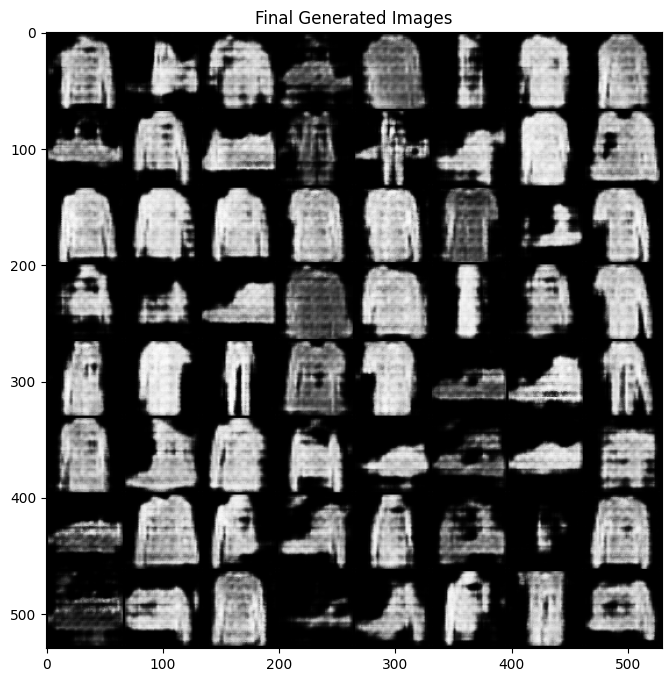

In [15]:
# @title 6. 模型结果输出并保存

# -- 最终生成一次图像并用matplotlib展示 --
with torch.no_grad(): # 在不需要计算梯度的模式下进行
    fake = gen(fixed_noise).to("cpu") # 使用固定的噪声生成最终的图像样本，并将其移回CPU以便matplotlib处理
    img_grid_fake = torchvision.utils.make_grid(fake, normalize=True) # 将生成的图像样本拼接成一个网格
    plt.figure(figsize=(8,8)) # 创建一个8x8英寸的画布
    plt.imshow(img_grid_fake.permute(1, 2, 0)) # 显示图像。permute(1, 2, 0)将张量从[C, H, W]格式转换为matplotlib期望的[H, W, C]格式
    plt.title("Final Generated Images") # 设置标题
    plt.show() # 展示绘图窗口

# -- 保存模型 --
torch.save(gen.state_dict(), 'generator_final.pth') # 保存生成器的学习到的参数（状态字典）到文件
torch.save(disc.state_dict(), 'discriminator_final.pth') # 保存判别器的参数到文件